In [ ]:
# More Reference 
# https://pycaret.gitbook.io/docs/
# https://pycaret.readthedocs.io/en/latest/index.html
# https://www.kdnuggets.com/2020/05/machine-learning-power-bi-pycaret.html
# https://www.kaggle.com/nareshbhat/starter-guide-to-build-nlp-ml-model-in-pycaret/notebook

# Setup Library

In [ ]:
#Step 1:  run this cell to install pycaret in Google Colab. Maybe it takes about 5 mins
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 320 kB 13.8 MB/s 
     |████████████████████████████████| 262 kB 61.0 MB/s 
     |████████████████████████████████| 10.4 MB 68.5 MB/s 
     |████████████████████████████████| 167 kB 61.4 MB/s 
     |████████████████████████████████| 636 kB 61.6 MB/s 
     |████████████████████████████████| 3.3 MB 54.5 MB/s 
     |████████████████████████████████| 88 kB 8.0 MB/s 
     |████████████████████████████████| 2.0 MB 53.8 MB/s 
     |████████████████████████████████| 56 kB 4.1 MB/s 
     |████████████████████████████████| 6.8 MB 65.1 MB/s 
     |████████████████████████████████| 25.9 MB 1.6 MB/s 
     |████████████████████████████████| 134 kB 61.0 MB/s 
     |████████████████████████████████| 1.3 MB 57.7 MB/s 
     |████████████████████████████████| 1.7 MB 62.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  In

In [ ]:
pip install --upgrade numpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.7 MB 19.0 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
yellowbrick 1.3.post1 requires numpy<1.20,>=1.16.0, but you have numpy 1.21.6 which is incompatible.
pymc3 3.11.5 requires scipy<1.8.0,>=1.7.3, but you have scipy 1.5.4 which is incompatible.
numba 0.54.1 requires numpy<1.21,>=1.17, but you have numpy 1.21.6 which is incompatible.
en-core-web-sm 3.4.0 requires spacy<3.5.0,>=3.4.0, but you have spacy 2.3.7 which is incompatible.


In [ ]:
from pycaret.utils import version
version()

'2.3.10'

In [ ]:
# only run this cell if you are using google colab
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [ ]:
# Remove Error missing jinja2 in pycaret
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Test the library imported successfully or not
from pycaret.clustering import *

# Overview Dataset 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Thay doi o dia de co the de dang lay bat ky du lieu nao trong drive
import os # Thu vien os giup lam viec voi o dia
path = "/content/drive/MyDrive/DA for practice" # Directory of Data
os.chdir(path) # Change Directory 

In [ ]:
[filename for filename in os.listdir() if filename.endswith('.csv')]

['boston.csv',
 'anomaly_detecting.csv',
 'jewellery.csv',
 'jewellery_clustering.csv',
 'SPAM text message 20170820 - Data.csv',
 'employee_result.csv',
 'kiva_result.csv',
 'kiva_topic_clustering.csv',
 'lda_results.csv',
 'nlp_clustering.csv',
 'nmf_results.csv',
 'jewellery_kmeans.csv',
 'price_result.csv']

In [ ]:
from pycaret.clustering import * # Load thu vien pycaret voi chuc nang clustering
from pycaret.datasets import get_data # Get datasets from Pycaret
import pandas as pd # Load thu vien pandas giup doc va xu ly bang du lieu

In [ ]:
from pycaret.clustering import * # Load thu vien pycaret voi chuc nang clustering
from pycaret.datasets import get_data # Get datasets from Pycaret
import pandas as pd # Load thu vien pandas giup doc va xu ly bang du lieu

,Dataset,Data Types,Default Task,Target Variable 1,Target Variable 2,# Instances,# Attributes,Missing Values
0,anomaly,Multivariate,Anomaly Detection,None,None,1000,10,N
1,france,Multivariate,Association Rule Mining,InvoiceNo,Description,8557,8,N
2,germany,Multivariate,Association Rule Mining,InvoiceNo,Description,9495,8,N
3,bank,Multivariate,Classification (Binary),deposit,None,45211,17,N
4,blood,Multivariate,Classification (Binary),Class,None,748,5,N
5,cancer,Multivariate,Classification (Binary),Class,None,683,10,N
6,credit,Multivariate,Classification (Binary),default,None,24000,24,N
7,diabetes,Multivariate,Classification (Binary),Class variable,None,768,9,N
8,electrical_grid,Multivariate,Classification (Binary),stabf,None,10000,14,N
9,employee,Multivariate,Classification (Binary),left,None,14999,10,N


In [ ]:
all_datasets[all_datasets["Dataset"] == "juice"].T

,14
Dataset,juice
Data Types,Multivariate
Default Task,Classification (Binary)
Target Variable 1,Purchase
Target Variable 2,None
# Instances,1070
# Attributes,15
Missing Values,N


In [ ]:
all_datasets[all_datasets["Dataset"] == "traffic"].T

,55
Dataset,traffic
Data Types,Multivariate
Default Task,Regression
Target Variable 1,traffic_volume
Target Variable 2,None
# Instances,48204
# Attributes,8
Missing Values,N


In [ ]:
all_datasets.query('Dataset == "jewellery"').T

,30
Dataset,jewellery
Data Types,Multivariate
Default Task,Clustering
Target Variable 1,None
Target Variable 2,None
# Instances,505
# Attributes,4
Missing Values,N


In [ ]:
jewellery = get_data('jewellery')
jewellery.shape

,Age,Income,SpendingScore,Savings
0,58,77769,0.791329,6559.829923
1,59,81799,0.791082,5417.661426
2,62,74751,0.702657,9258.992965
3,59,74373,0.765680,7346.334504
4,87,17760,0.348778,16869.507130


(505, 4)

In [ ]:
all_datasets.query('Dataset == "automobile"').T

,44
Dataset,automobile
Data Types,Multivariate
Default Task,Regression
Target Variable 1,price
Target Variable 2,None
# Instances,202
# Attributes,26
Missing Values,Y


In [ ]:
automobile = get_data('automobile')
automobile.shape

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,width,height,curb-weight,engine-type,num-of-cylinders,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,NaN,alfa-romero,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,NaN,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164.0,audi,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.4,10.0,102,5500,24,30,13950
4,2,164.0,audi,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.4,8.0,115,5500,18,22,17450


(202, 26)

In [ ]:
all_datasets.query('Dataset == "amazon"').T

,40
Dataset,amazon
Data Types,Text
Default Task,NLP / Classification
Target Variable 1,reviewText
Target Variable 2,None
# Instances,20000
# Attributes,2
Missing Values,N


In [ ]:
amazon = get_data('amazon')
amazon.shape

,reviewText,Positive
0,This is a one of the best apps acording to a b...,1
1,This is a pretty good version of the game for ...,1
2,this is a really cool game. there are a bunch ...,1
3,"This is a silly game and can be frustrating, b...",1
4,This is a terrific game on any pad. Hrs of fun...,1


(20000, 2)

# Machine Learning using PyCaret

**Clustering** — Group data points with similar characteristics.

**Anomaly Detection** — Identify rare observations / outliers in the data.

**Natural Language Processing** — Analyze text data via topic modeling.

**Association Rule Mining** — Find interesting relationships in the data.

**Classification** — Predict categorical class labels that are binary (1 or 0).

**Regression** — Predict continuous value such as Sales, Price etc

`“PyCaret is democratizing machine learning and the use of advanced analytics by providing free, open source, and low-code machine learning solution for business analysts, domain experts, citizen data scientists, and experienced data scientists”.`

Clustering 

Clustering is a machine learning technique that groups data points with similar characteristics. These groupings are useful for exploring data, identifying patterns and analyzing a subset of data. Some common business use cases for clustering are:

✔ Customer segmentation for the purpose of marketing.

✔ Customer purchasing behavior analysis for promotions and discounts.

✔ Identifying geo-clusters in an epidemic outbreak such as COVID-19.

In [ ]:
# https://pycaret.readthedocs.io/en/latest/api/clustering.html

In [ ]:
jewellery = pd.read_csv("jewellery.csv") # Doc du lieu tu file csv vao bien du lieu dataset

In [ ]:
display(jewellery.head()) # Xuat 5 dong dau tien trong bang du lieu thong qua bien du lieu 
print(jewellery.shape) # Xuat kich thuoc du lieu gom so dong va so cot

,Age,Income,SpendingScore,Savings
0,58,77769,0.791329,6559.829923
1,59,81799,0.791082,5417.661426
2,62,74751,0.702657,9258.992965
3,59,74373,0.765680,7346.334504
4,87,17760,0.348778,16869.507130


(505, 4)


In [ ]:
import random
random.seed(10)

exp_name = setup(data = jewellery)
kmeans = create_model('kmeans')
kmeans_df = assign_model(kmeans)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7207,5011.8113,0.4114,0,0,0


In [ ]:
display(kmeans_df.head(10))
Stats = kmeans_df["Cluster"].value_counts().sort_index()
display(Stats)

,Age,Income,SpendingScore,Savings,Cluster
0,58,77769,0.791329,6559.829923,Cluster 2
1,59,81799,0.791082,5417.661426,Cluster 2
2,62,74751,0.702657,9258.992965,Cluster 2
3,59,74373,0.765680,7346.334504,Cluster 2
4,87,17760,0.348778,16869.507130,Cluster 1
5,29,131578,0.847034,3535.514352,Cluster 0
6,54,76500,0.785198,6878.884249,Cluster 2
7,87,42592,0.355290,18086.287158,Cluster 1
8,83,34384,0.324719,14783.379086,Cluster 1
9,84,27693,0.367063,17879.558906,Cluster 1


Cluster 0     72
Cluster 1    147
Cluster 2    156
Cluster 3    130
Name: Cluster, dtype: int64

In [ ]:
for cluster_name in Stats.keys(): # lap tren chia khoa bang bien cluster_name
  group = kmeans_df.query(f'Cluster == "{cluster_name}"') # Trich du lieu theo tung nhom 
  print(cluster_name)
  display(group.describe()) # Xuat gia tri thong ke theo nhom
  print("**" * 50)

Cluster 0


,Age,Income,SpendingScore,Savings
count,72.00000,72.000000,72.000000,72.000000
mean,40.87500,126031.666667,0.654598,7287.926100
std,27.65631,5960.033701,0.373470,4997.245126
min,17.00000,117050.000000,0.000000,0.000000
25%,23.75000,121405.000000,0.148840,3781.965240
50%,26.50000,124690.000000,0.872804,4876.232739
75%,78.25000,130043.000000,0.910540,13734.686228
max,93.00000,142000.000000,1.000000,16215.399077


****************************************************************************************************
Cluster 1


,Age,Income,SpendingScore,Savings
count,147.000000,147.000000,147.000000,147.000000
mean,87.775510,27866.102041,0.328800,16659.261445
std,3.508885,6448.805481,0.045224,1183.850178
min,79.000000,12000.000000,0.203140,13470.970605
25%,85.000000,23361.000000,0.301502,15957.282919
50%,88.000000,27771.000000,0.324719,16711.067980
75%,91.000000,32601.000000,0.357267,17433.126684
max,97.000000,46977.000000,0.473550,20000.000000


****************************************************************************************************
Cluster 2


,Age,Income,SpendingScore,Savings
count,156.000000,156.000000,156.000000,156.000000
mean,59.961538,72332.846154,0.771296,6890.893287
std,3.386662,6090.520671,0.046122,1055.601838
min,51.000000,56321.000000,0.657314,4077.658657
25%,58.000000,68417.000000,0.740074,6220.447724
50%,59.500000,71980.000000,0.766657,6848.805845
75%,62.000000,76578.250000,0.800583,7498.036809
max,68.000000,88361.000000,0.910417,10547.775368


****************************************************************************************************
Cluster 3


,Age,Income,SpendingScore,Savings
count,130.000000,130.000000,130.000000,130.000000
mean,35.423077,105228.392308,0.302153,14937.836526
std,11.825518,6060.656557,0.081475,1307.897632
min,22.000000,89598.000000,0.032208,6746.281084
25%,30.000000,100760.250000,0.275447,14223.787562
50%,33.000000,106179.500000,0.308421,14971.611932
75%,36.000000,109065.750000,0.340665,15761.483665
max,88.000000,117112.000000,0.806210,17968.553929


****************************************************************************************************


In [ ]:
for cluster_name in Stats.keys(): # lap tren chia khoa bang bien cluster_name
  group = kmeans_df.query(f'Cluster == "{cluster_name}"') # Trich du lieu theo tung nhom 
  print(cluster_name , ":" ,  group.shape )
  df = group.describe()
  for col in df.columns:
    minV, maxV = round(df.loc["min", col],3), round(df.loc["max", col],3)
    print(f'\t {col} : min : {minV} and max {maxV}')
  print("**" * 50)

Cluster 0 : (72, 5)
	 Age : min : 17.0 and max 93.0
	 Income : min : 117050.0 and max 142000.0
	 SpendingScore : min : 0.0 and max 1.0
	 Savings : min : 0.0 and max 16215.399
****************************************************************************************************
Cluster 1 : (147, 5)
	 Age : min : 79.0 and max 97.0
	 Income : min : 12000.0 and max 46977.0
	 SpendingScore : min : 0.203 and max 0.474
	 Savings : min : 13470.971 and max 20000.0
****************************************************************************************************
Cluster 2 : (156, 5)
	 Age : min : 51.0 and max 68.0
	 Income : min : 56321.0 and max 88361.0
	 SpendingScore : min : 0.657 and max 0.91
	 Savings : min : 4077.659 and max 10547.775
****************************************************************************************************
Cluster 3 : (130, 5)
	 Age : min : 22.0 and max 88.0
	 Income : min : 89598.0 and max 117112.0
	 SpendingScore : min : 0.032 and max 0.806
	 Savings : min : 6

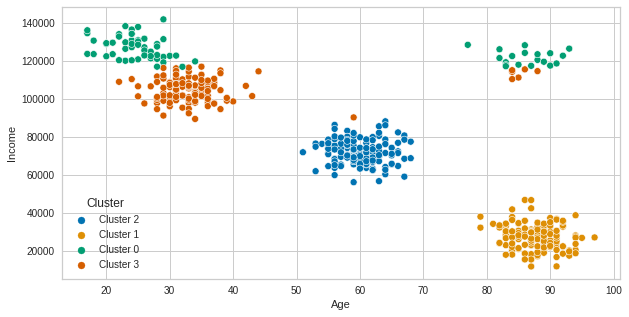

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize = (10, 5))
sns.scatterplot(x="Age", y="Income", hue="Cluster", data=kmeans_df, palette='colorblind')
plt.show()

In [ ]:
kmeans_upd = kmeans_df.copy()
IdxRows1 = kmeans_upd[(kmeans_upd["Cluster"] == "Cluster 3") & (kmeans_upd["Age"] >= 50)].index
IdxRows2 = kmeans_upd[(kmeans_upd["Cluster"] == "Cluster 0") & (kmeans_upd["Age"] >= 50)].index
IdxRows = list(set(set(IdxRows1) | set(IdxRows2)))
kmeans_upd.loc[IdxRows, "Cluster"] = "Cluster 4"
kmeans_upd["Cluster"].value_counts()

Cluster 2    156
Cluster 1    147
Cluster 3    123
Cluster 0     53
Cluster 4     26
Name: Cluster, dtype: int64

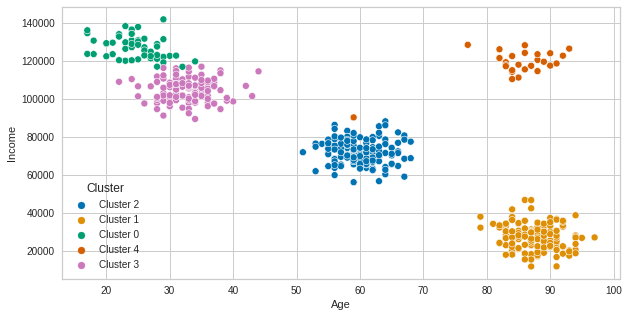

In [ ]:
plt.figure(figsize = (10, 5))
sns.scatterplot(x="Age", y="Income", hue="Cluster", data=kmeans_upd, palette='colorblind')
plt.show()

In [ ]:
kmeans_upd.to_csv("jewellery_kmeans.csv")

In [ ]:
# More Implementation
# ‘kmeans’ - K-Means Clustering
# ‘ap’ - Affinity Propagation
# ‘meanshift’ - Mean shift Clustering
# ‘sc’ - Spectral Clustering
# ‘hclust’ - Agglomerative Clustering
# ‘dbscan’ - Density-Based Spatial Clustering
# ‘optics’ - OPTICS Clustering
# ‘birch’ - Birch Clustering
# ‘kmodes’ - K-Modes Clustering

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.6777,4685.1997,0.4596,0,0,0


,Age,Income,SpendingScore,Savings,Cluster
0,58,77769,0.791329,6559.829923,Cluster 2
1,59,81799,0.791082,5417.661426,Cluster 2
2,62,74751,0.702657,9258.992965,Cluster 2
3,59,74373,0.765680,7346.334504,Cluster 2
4,87,17760,0.348778,16869.507130,Cluster 0


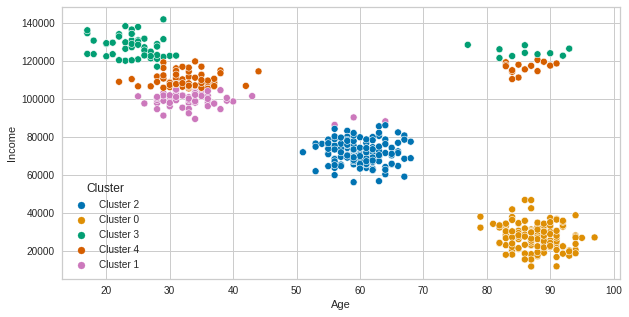

In [ ]:
ExpW5 = create_model('kmeans', num_clusters = 5)
ExpW5_df = assign_model(ExpW5)
display(ExpW5_df.head())

plt.figure(figsize = (10, 5))
sns.scatterplot(x="Age", y="Income", hue="Cluster", data=ExpW5_df, palette='colorblind')
plt.show()

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7393,3567.5361,0.3435,0,0,0


,Age,Income,SpendingScore,Savings,Cluster
0,58,77769,0.791329,6559.829923,Cluster 1
1,59,81799,0.791082,5417.661426,Cluster 1
2,62,74751,0.702657,9258.992965,Cluster 1
3,59,74373,0.765680,7346.334504,Cluster 1
4,87,17760,0.348778,16869.507130,Cluster 2


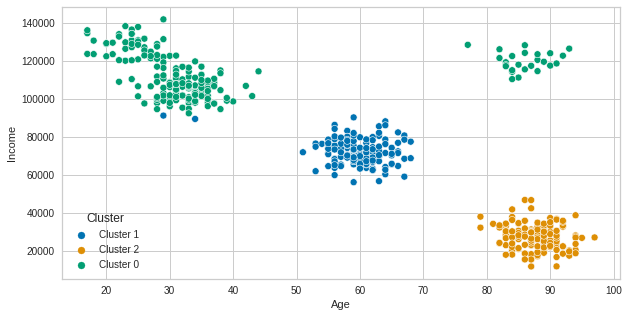

In [ ]:
ExpW5 = create_model('meanshift', num_clusters = 5)
ExpW5_df = assign_model(ExpW5)
display(ExpW5_df.head())

plt.figure(figsize = (10, 5))
sns.scatterplot(x="Age", y="Income", hue="Cluster", data=ExpW5_df, palette='colorblind')
plt.show()

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.706,4827.224,0.4339,0,0,0


,Age,Income,SpendingScore,Savings,Cluster
0,58,77769,0.791329,6559.829923,Cluster 2
1,59,81799,0.791082,5417.661426,Cluster 2
2,62,74751,0.702657,9258.992965,Cluster 2
3,59,74373,0.765680,7346.334504,Cluster 2
4,87,17760,0.348778,16869.507130,Cluster 1


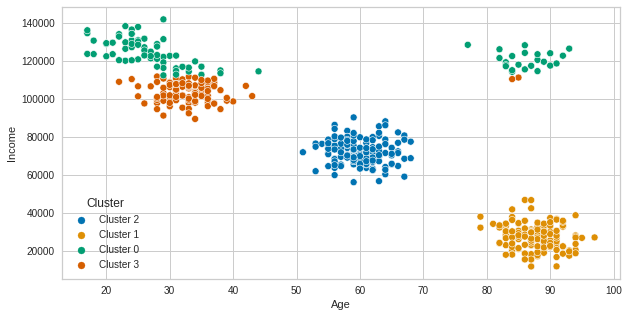

In [ ]:
ExpW5 = create_model('hclust', num_clusters = 4)
ExpW5_df = assign_model(ExpW5)
display(ExpW5_df.head())

plt.figure(figsize = (10, 5))
sns.scatterplot(x="Age", y="Income", hue="Cluster", data=ExpW5_df, palette='colorblind')
plt.show()

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.706,4827.224,0.4339,0,0,0


,Age,Income,SpendingScore,Savings,Cluster
0,58,77769,0.791329,6559.829923,Cluster 2
1,59,81799,0.791082,5417.661426,Cluster 2
2,62,74751,0.702657,9258.992965,Cluster 2
3,59,74373,0.765680,7346.334504,Cluster 2
4,87,17760,0.348778,16869.507130,Cluster 1


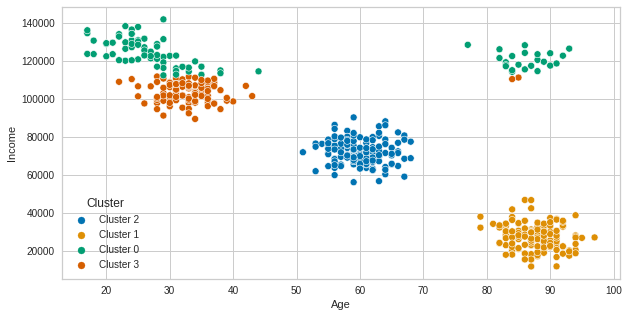

In [ ]:
ExpW5 = create_model('birch', num_clusters = 4)
ExpW5_df = assign_model(ExpW5)
display(ExpW5_df.head())

plt.figure(figsize = (10, 5))
sns.scatterplot(x="Age", y="Income", hue="Cluster", data=ExpW5_df, palette='colorblind')
plt.show()

# Anomaly Detection 

Anomaly Detection is a machine learning technique used for identifying rare items, events, or observations by checking for rows in the table that differ significantly from the majority of the rows. Typically, the anomalous items will translate to some kind of problem such as bank fraud, a structural defect, medical problem or error. Some common business use cases for anomaly detection are:

✔ Fraud detection (credit cards, insurance, etc.) using financial data.

✔ Intrusion detection (system security, malware) or monitoring for network traffic surges and drops.

✔ Identifying multivariate outliers in the dataset.

In [8]:
# Anomaly Data Points ==> Detect ==> Monitor ==> Action : Risk Management
from pycaret.anomaly import *
link = "https://raw.githubusercontent.com/pycaret/pycaret/master/datasets/anomaly.csv"
anomaly = pd.read_csv(link)
display(anomaly.head())
print(anomaly.shape)

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754


(1000, 10)


In [10]:
exp_name = setup(data = anomaly)
knn = create_model('knn')

INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:KNN(algorithm='auto', contamination=0.05, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
  radius=1.0)
INFO:logs:create_model() succesfully completed......................................


In [11]:
knn_results = assign_model(knn)
knn_results.head()

INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=KNN(algorithm='auto', contamination=0.05, leaf_size=30, method='largest',
  metric='minkowski', metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
  radius=1.0), transformation=False, score=True, verbose=True)
INFO:logs:Checking exceptions
INFO:logs:Determining Trained Model
INFO:logs:Trained Model : K-Nearest Neighbors Detector
INFO:logs:Copying data
INFO:logs:(1000, 12)
INFO:logs:assign_model() succesfully completed......................................


,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,0.569672
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,0.484217
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,1,0.691915
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.811600
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,0.634337


In [ ]:
knn_results["Anomaly_Threshold"] = 0
IndexListt = knn_results[knn_results["Anomaly_Score"] > 0.8].index
knn_results.loc[IndexListt, "Anomaly_Threshold"] = 1

In [ ]:
knn_results["Anomaly_Threshold"].value_counts()

0    974
1     26
Name: Anomaly_Threshold, dtype: int64

In [ ]:
knn_results["Anomaly"].value_counts()

0    950
1     50
Name: Anomaly, dtype: int64

In [ ]:
knn_anomaly=knn_results[knn_results['Anomaly']==1]
knn_anomaly.shape

(50, 13)

In [ ]:
plot_model(knn, plot = 'tsne')

In [ ]:
iforest = create_model('iforest')
print(iforest)

IForest(behaviour='new', bootstrap=False, contamination=0.05,
    max_features=1.0, max_samples='auto', n_estimators=100, n_jobs=-1,
    random_state=7176, verbose=0)


In [ ]:
iforest_results = assign_model(iforest)
iforest_results.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,-0.019589
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,-0.066960
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,1,0.002348
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.039148
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,-0.017307


In [ ]:
iforest_anomaly=iforest_results[iforest_results['Anomaly']==1]
iforest_anomaly.shape

(50, 12)

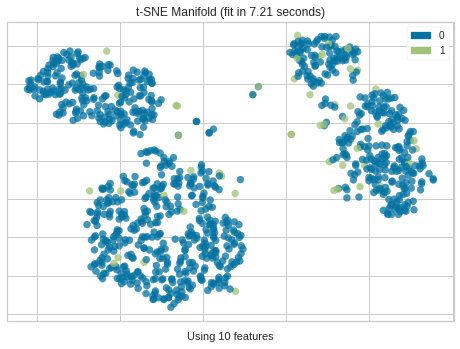

In [ ]:
from yellowbrick.features import Manifold
dfr = iforest_results['Anomaly']
viz = Manifold(manifold="tsne")
viz.fit_transform(anomaly, dfr)
viz.show()

In [ ]:
lof = create_model('lof')
print(lof)

LOF(algorithm='auto', contamination=0.05, leaf_size=30, metric='minkowski',
  metric_params=None, n_jobs=-1, n_neighbors=20, novelty=True, p=2)


In [ ]:
lof_results = assign_model(lof)
lof_results.head()

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,1.262565
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,1.043429
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,0,1.331218
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,1.591832
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,1.223609


In [ ]:
lof_anomaly=lof_results[lof_results['Anomaly']==1]
lof_anomaly.shape

(50, 12)

In [ ]:
plot_model(lof, plot = 'tsne')

#  Natural Language Processing 

Several techniques are used to analyze text data among which Topic Modeling is a popular one. A topic model is a type of statistical model for discovering the abstract topics in a collection of documents. Topic modeling is a frequently used text-mining tool for the discovery of hidden semantic structures in a text data.

In [ ]:
from pycaret.datasets import get_data
data = get_data('kiva')

,country,en,gender,loan_amount,nonpayment,sector,status
0,Dominican Republic,"""Banco Esperanza"" is a group of 10 women looki...",F,1225,partner,Retail,0
1,Dominican Republic,"""Caminemos Hacia Adelante"" or ""Walking Forward...",F,1975,lender,Clothing,0
2,Dominican Republic,"""Creciendo Por La Union"" is a group of 10 peop...",F,2175,partner,Clothing,0
3,Dominican Republic,"""Cristo Vive"" (""Christ lives"" is a group of 10...",F,1425,partner,Clothing,0
4,Dominican Republic,"""Cristo Vive"" is a large group of 35 people, 2...",F,4025,partner,Food,0


In [ ]:
# sampling the data to select only 1000 documents
data = data.sample(1000, random_state=786).reset_index(drop = True)
data.shape

(1000, 8)

In [ ]:
from pycaret.nlp import *

In [ ]:
!pip install spacy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/



In [ ]:
!python -m spacy download en_core_web_sm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached en_core_web_sm-2.3.1-py3-none-any.whl
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')


In [ ]:
exp_nlp101 = setup(data = data, target = 'en', session_id = 123)

Description,Value
session_id,123
Documents,1000
Vocab Size,4615
Custom Stopwords,False


In [ ]:
#convert 'en' column of dataset into list format
text_list = list(data['en'])
type(text_list)

list

In [ ]:
exp_nlp101_list = setup(data = text_list, session_id = 123)

Description,Value
session_id,123
Documents,1000
Vocab Size,4615
Custom Stopwords,False


In [ ]:
lda = create_model('lda')

In [ ]:
print(lda)

LdaModel(num_terms=4615, num_topics=4, decay=0.5, chunksize=100)


In [ ]:
lda2 = create_model('lda', num_topics = 6, multi_core = True)

In [ ]:
print(lda2)

LdaModel(num_terms=4615, num_topics=6, decay=0.5, chunksize=100)


In [ ]:
lda_results = assign_model(lda)
lda_results.head()

,en,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic,Perc_Dominant_Topic
0,store sell article necessity school supply sto...,0.000386,0.004151,0.990698,0.004765,Topic 2,0.99
1,year old married mother child child still stil...,0.000244,0.002567,0.582030,0.415159,Topic 2,0.58
2,year old marry kid grade young child still bab...,0.000484,0.597311,0.345403,0.056802,Topic 1,0.60
3,year old son daughter twentie make curtain dec...,0.000591,0.006138,0.725545,0.267726,Topic 2,0.73
4,year old live life purity good moral founder g...,0.000493,0.977446,0.015286,0.006776,Topic 1,0.98


In [ ]:
plot_model()

In [ ]:
plot_model(plot = 'bigram')

In [ ]:
plot_model(lda, plot = 'frequency', topic_num = 'Topic 1')

In [ ]:
plot_model(lda, plot = 'topic_distribution')

In [ ]:
data = pd.read_csv('SPAM text message 20170820 - Data.csv')
data.head()

,Category,Message
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."


In [ ]:
nlp = setup(data = data, target = 'Message', session_id = 1)

Description,Value
session_id,1
Documents,5572
Vocab Size,4138
Custom Stopwords,False


In [ ]:
lda = create_model('lda', multi_core = True)

In [ ]:
lda_data = assign_model(lda)
lda_data.head()

,Category,Message,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic,Perc_Dominant_Topic
0,ham,go point available great get,0.043446,0.235921,0.675057,0.045577,Topic 2,0.68
1,ham,,0.250000,0.250000,0.250000,0.250000,Topic 0,0.25
2,spam,free entry wkly may text receive entry questio...,0.019738,0.019552,0.019432,0.941278,Topic 3,0.94
3,ham,say early hor already say,0.042269,0.041969,0.873061,0.042701,Topic 2,0.87
4,ham,think go usf live around though,0.322921,0.036143,0.038104,0.602832,Topic 3,0.60


In [ ]:
from pycaret.classification import *

In [ ]:
model = setup(data = lda_data, target = 'Category',ignore_features=['Message','Dominant_Topic','Perc_Dominant_Topic'])

,Description,Value
0,session_id,8056
1,Target,Category
2,Target Type,Binary
3,Label Encoded,"ham: 0, spam: 1"
4,Original Data,"(5572, 8)"
5,Missing Values,False
6,Numeric Features,4
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9046,0.8706,0.5358,0.6975,0.6020,0.5492,0.5576,0.855
lightgbm,Light Gradient Boosting Machine,0.8987,0.8617,0.4906,0.6799,0.5670,0.5116,0.5219,0.128
et,Extra Trees Classifier,0.8979,0.8626,0.5434,0.6510,0.5896,0.5322,0.5365,0.557
gbc,Gradient Boosting Classifier,0.8944,0.8551,0.3792,0.7095,0.4934,0.4405,0.4680,0.436
ada,Ada Boost Classifier,0.8792,0.8325,0.3226,0.6112,0.4198,0.3597,0.3838,0.195
dt,Decision Tree Classifier,0.8708,0.7309,0.5642,0.5288,0.5432,0.4684,0.4704,0.027
knn,K Neighbors Classifier,0.8697,0.8035,0.3396,0.5455,0.4159,0.3468,0.3607,0.122
lr,Logistic Regression,0.8641,0.7387,0.0000,0.0000,0.0000,0.0000,0.0000,0.316
svm,SVM - Linear Kernel,0.8641,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.019
ridge,Ridge Classifier,0.8641,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.014


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=8056, verbose=0,
                       warm_start=False)

In [ ]:
best_model = create_model('rf', verbose = False)
best_model = finalize_model(best_model)

In [ ]:
save_model(best_model, 'spam_model.h5')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['Message',
                                                        'Dominant_Topic',
                                                        'Perc_Dominant_Topic'],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='Category',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_catego...
                  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                         class_weight=None, criterion='gini',
                                       

In [ ]:
dataset_result = predict_model(best_model, data = lda_data)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0,0.9971,0,0,0,0,0


In [ ]:
dataset_result.head()

,Category,Message,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic,Perc_Dominant_Topic,Label,Score
0,ham,go point available great get,0.043446,0.235921,0.675057,0.045577,Topic 2,0.68,ham,0.9500
1,ham,,0.250000,0.250000,0.250000,0.250000,Topic 0,0.25,ham,0.9829
2,spam,free entry wkly may text receive entry questio...,0.019738,0.019552,0.019432,0.941278,Topic 3,0.94,spam,1.0000
3,ham,say early hor already say,0.042269,0.041969,0.873061,0.042701,Topic 2,0.87,ham,1.0000
4,ham,think go usf live around though,0.322921,0.036143,0.038104,0.602832,Topic 3,0.60,ham,0.9900


In [ ]:
print(dataset_result.shape)
dataset_diff = dataset_result[dataset_result["Category"] != dataset_result["Label"]]
print(dataset_diff.shape)

(5572, 10)
(8, 10)


In [ ]:
dataset_diff.head(10)

,Category,Message,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic,Perc_Dominant_Topic,Label,Score
117,spam,,0.250000,0.250000,0.250000,0.250000,Topic 0,0.25,ham,0.9829
576,spam,,0.250000,0.250000,0.250000,0.250000,Topic 0,0.25,ham,0.9829
650,spam,,0.250000,0.250000,0.250000,0.250000,Topic 0,0.25,ham,0.9829
713,spam,,0.250000,0.250000,0.250000,0.250000,Topic 0,0.25,ham,0.9829
3126,spam,hit,0.125031,0.125015,0.624942,0.125013,Topic 2,0.62,ham,0.5457
3598,spam,congratulation,0.125013,0.125013,0.125010,0.624964,Topic 3,0.62,ham,0.5315
3742,spam,,0.250000,0.250000,0.250000,0.250000,Topic 0,0.25,ham,0.9829
4823,spam,,0.250000,0.250000,0.250000,0.250000,Topic 0,0.25,ham,0.9829


# Association Rule Mining in Power BI

Association Rule Mining is a rule-based machine learning technique for discovering interesting relations between variables in a database. It is intended to identify strong rules using measures of interestingness. Some common business use cases for association rule mining are:

✔ Market Basket Analysis to understand items frequently bought together.

✔ Medical Diagnosis to assist physicians in determining occurrence probability of illness given factors and symptoms.

In [ ]:
link = "https://raw.githubusercontent.com/pycaret/pycaret/master/datasets/france.csv"
dataset = pd.read_csv(link)
display(dataset.head())
print(dataset.shape)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536370,22728,ALARM CLOCK BAKELIKE PINK,24,12/1/2010 8:45,3.75,12583.0,France
1,536370,22727,ALARM CLOCK BAKELIKE RED,24,12/1/2010 8:45,3.75,12583.0,France
2,536370,22726,ALARM CLOCK BAKELIKE GREEN,12,12/1/2010 8:45,3.75,12583.0,France
3,536370,21724,PANDA AND BUNNIES STICKER SHEET,12,12/1/2010 8:45,0.85,12583.0,France
4,536370,21883,STARS GIFT TAPE,24,12/1/2010 8:45,0.65,12583.0,France


(8557, 8)


In [ ]:
from pycaret.arules import *
dataset_rule = get_rules(dataset, transaction_id = 'InvoiceNo', item_id = 'Description')

Description,Value
session_id,7176
# Transactions,461
# Items,1565
Ignore Items,None


In [ ]:
display(dataset_rule.head())
print(dataset_rule.shape)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(JUMBO BAG WOODLAND ANIMALS),(POSTAGE),0.0651,0.6746,0.0651,1.0000,1.4823,0.0212,inf
1,"(SET/20 RED RETROSPOT PAPER NAPKINS , SET/6 RE...",(SET/6 RED SPOTTY PAPER CUPS),0.0868,0.1171,0.0846,0.9750,8.3236,0.0744,35.3145
2,"(SET/6 RED SPOTTY PAPER CUPS, SET/20 RED RETRO...",(SET/6 RED SPOTTY PAPER PLATES),0.0868,0.1085,0.0846,0.9750,8.9895,0.0752,35.6616
3,"(POSTAGE, SET/6 RED SPOTTY PAPER CUPS, SET/20 ...",(SET/6 RED SPOTTY PAPER PLATES),0.0716,0.1085,0.0694,0.9697,8.9406,0.0617,29.4208
4,"(POSTAGE, SET/20 RED RETROSPOT PAPER NAPKINS ,...",(SET/6 RED SPOTTY PAPER CUPS),0.0716,0.1171,0.0694,0.9697,8.2783,0.0610,29.1345


(141, 9)


In [ ]:
dataset_rule[dataset_rule["consequents"] == dataset_rule.loc[0, "consequents"]]


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(JUMBO BAG WOODLAND ANIMALS),(POSTAGE),0.0651,0.6746,0.0651,1.0000,1.4823,0.0212,inf
5,(SET OF 9 BLACK SKULL BALLOONS),(POSTAGE),0.0564,0.6746,0.0542,0.9615,1.4253,0.0162,8.4599
6,(PACK OF 6 SKULL PAPER CUPS),(POSTAGE),0.0542,0.6746,0.0521,0.9600,1.4230,0.0155,8.1345
9,(TEA PARTY BIRTHDAY CARD),(POSTAGE),0.0803,0.6746,0.0759,0.9459,1.4022,0.0218,6.0195
10,(STRAWBERRY LUNCH BOX WITH CUTLERY),(POSTAGE),0.1041,0.6746,0.0976,0.9375,1.3897,0.0274,5.2061
11,(RED RETROSPOT PICNIC BAG),(POSTAGE),0.0629,0.6746,0.0586,0.9310,1.3801,0.0161,4.7180
12,(ASSORTED COLOUR MINI CASES),(POSTAGE),0.0586,0.6746,0.0542,0.9259,1.3725,0.0147,4.3926
13,(SET OF 2 TEA TOWELS APPLE AND PEARS),(POSTAGE),0.0586,0.6746,0.0542,0.9259,1.3725,0.0147,4.3926
15,"(LUNCH BAG APPLE DESIGN, LUNCH BAG RED RETROSPOT)",(POSTAGE),0.0564,0.6746,0.0521,0.9231,1.3683,0.0140,4.2299
16,(ALARM CLOCK BAKELIKE RED ),(POSTAGE),0.0803,0.6746,0.0738,0.9189,1.3621,0.0196,4.0130


In [ ]:
dataset_rule[dataset_rule["consequents"] == dataset_rule.loc[0, "consequents"]]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(JUMBO BAG WOODLAND ANIMALS),(POSTAGE),0.0651,0.6746,0.0651,1.0000,1.4823,0.0212,inf
5,(SET OF 9 BLACK SKULL BALLOONS),(POSTAGE),0.0564,0.6746,0.0542,0.9615,1.4253,0.0162,8.4599
7,(PACK OF 6 SKULL PAPER CUPS),(POSTAGE),0.0542,0.6746,0.0521,0.9600,1.4230,0.0155,8.1345
9,(TEA PARTY BIRTHDAY CARD),(POSTAGE),0.0803,0.6746,0.0759,0.9459,1.4022,0.0218,6.0195
10,(STRAWBERRY LUNCH BOX WITH CUTLERY),(POSTAGE),0.1041,0.6746,0.0976,0.9375,1.3897,0.0274,5.2061
11,(RED RETROSPOT PICNIC BAG),(POSTAGE),0.0629,0.6746,0.0586,0.9310,1.3801,0.0161,4.7180
12,(SET OF 2 TEA TOWELS APPLE AND PEARS),(POSTAGE),0.0586,0.6746,0.0542,0.9259,1.3725,0.0147,4.3926
14,(ASSORTED COLOUR MINI CASES),(POSTAGE),0.0586,0.6746,0.0542,0.9259,1.3725,0.0147,4.3926
15,"(LUNCH BAG APPLE DESIGN, LUNCH BAG RED RETROSPOT)",(POSTAGE),0.0564,0.6746,0.0521,0.9231,1.3683,0.0140,4.2299
16,(ALARM CLOCK BAKELIKE RED ),(POSTAGE),0.0803,0.6746,0.0738,0.9189,1.3621,0.0196,4.0130


In [ ]:
dataset_rule[dataset_rule["consequents"] == dataset_rule.loc[0, "consequents"]]


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(JUMBO BAG WOODLAND ANIMALS),(POSTAGE),0.0651,0.6746,0.0651,1.0000,1.4823,0.0212,inf
5,(SET OF 9 BLACK SKULL BALLOONS),(POSTAGE),0.0564,0.6746,0.0542,0.9615,1.4253,0.0162,8.4599
6,(PACK OF 6 SKULL PAPER CUPS),(POSTAGE),0.0542,0.6746,0.0521,0.9600,1.4230,0.0155,8.1345
9,(TEA PARTY BIRTHDAY CARD),(POSTAGE),0.0803,0.6746,0.0759,0.9459,1.4022,0.0218,6.0195
10,(STRAWBERRY LUNCH BOX WITH CUTLERY),(POSTAGE),0.1041,0.6746,0.0976,0.9375,1.3897,0.0274,5.2061
11,(RED RETROSPOT PICNIC BAG),(POSTAGE),0.0629,0.6746,0.0586,0.9310,1.3801,0.0161,4.7180
12,(ASSORTED COLOUR MINI CASES),(POSTAGE),0.0586,0.6746,0.0542,0.9259,1.3725,0.0147,4.3926
13,(SET OF 2 TEA TOWELS APPLE AND PEARS),(POSTAGE),0.0586,0.6746,0.0542,0.9259,1.3725,0.0147,4.3926
15,"(LUNCH BAG APPLE DESIGN, LUNCH BAG RED RETROSPOT)",(POSTAGE),0.0564,0.6746,0.0521,0.9231,1.3683,0.0140,4.2299
16,(ALARM CLOCK BAKELIKE RED ),(POSTAGE),0.0803,0.6746,0.0738,0.9189,1.3621,0.0196,4.0130


In [ ]:
search = 'POSTAGE'
IdxList = []
for index, rows in dataset_rule.iterrows():
  if search in [x for x in rows["consequents"]]:
    IdxList.append(index)
print(IdxList)
display(dataset_rule.loc[IdxList, :])

[0, 5, 6, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 22, 23, 25, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 56, 57, 58, 59, 60, 63, 65, 66, 69, 70, 72, 73, 80, 81, 88, 94, 96, 98, 104, 105, 108, 111, 112, 113, 115, 116, 118, 121, 122, 124, 135]


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(JUMBO BAG WOODLAND ANIMALS),(POSTAGE),0.0651,0.6746,0.0651,1.0000,1.4823,0.0212,inf
5,(SET OF 9 BLACK SKULL BALLOONS),(POSTAGE),0.0564,0.6746,0.0542,0.9615,1.4253,0.0162,8.4599
6,(PACK OF 6 SKULL PAPER CUPS),(POSTAGE),0.0542,0.6746,0.0521,0.9600,1.4230,0.0155,8.1345
9,(TEA PARTY BIRTHDAY CARD),(POSTAGE),0.0803,0.6746,0.0759,0.9459,1.4022,0.0218,6.0195
10,(STRAWBERRY LUNCH BOX WITH CUTLERY),(POSTAGE),0.1041,0.6746,0.0976,0.9375,1.3897,0.0274,5.2061
...,...,...,...,...,...,...,...,...,...
118,(SET/6 RED SPOTTY PAPER CUPS),"(POSTAGE, SET/20 RED RETROSPOT PAPER NAPKINS )",0.1171,0.0933,0.0716,0.6111,6.5517,0.0607,2.3316
121,(PLASTERS IN TIN SPACEBOY),"(PLASTERS IN TIN WOODLAND ANIMALS, POSTAGE)",0.1193,0.1171,0.0716,0.6000,5.1222,0.0576,2.2072
122,(ALARM CLOCK BAKELIKE PINK),"(ALARM CLOCK BAKELIKE GREEN, POSTAGE)",0.0868,0.0716,0.0521,0.6000,8.3818,0.0458,2.3210
124,(SET/6 RED SPOTTY PAPER CUPS),"(POSTAGE, SET/20 RED RETROSPOT PAPER NAPKINS ,...",0.1171,0.0716,0.0694,0.5926,8.2783,0.0610,2.2788


In [ ]:
search = 'POSTAGE'
IdxList = []
for index, rows in dataset_rule.iterrows():
  if search in [x for x in rows["consequents"]]:
    IdxList.append(index)
print(IdxList)
display(dataset_rule.loc[IdxList, :])

[0, 5, 6, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 22, 23, 25, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 52, 53, 56, 57, 58, 59, 60, 63, 65, 66, 69, 70, 72, 73, 80, 81, 88, 94, 96, 98, 104, 105, 108, 111, 112, 113, 115, 116, 118, 121, 122, 124, 135]


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(JUMBO BAG WOODLAND ANIMALS),(POSTAGE),0.0651,0.6746,0.0651,1.0000,1.4823,0.0212,inf
5,(SET OF 9 BLACK SKULL BALLOONS),(POSTAGE),0.0564,0.6746,0.0542,0.9615,1.4253,0.0162,8.4599
6,(PACK OF 6 SKULL PAPER CUPS),(POSTAGE),0.0542,0.6746,0.0521,0.9600,1.4230,0.0155,8.1345
9,(TEA PARTY BIRTHDAY CARD),(POSTAGE),0.0803,0.6746,0.0759,0.9459,1.4022,0.0218,6.0195
10,(STRAWBERRY LUNCH BOX WITH CUTLERY),(POSTAGE),0.1041,0.6746,0.0976,0.9375,1.3897,0.0274,5.2061
...,...,...,...,...,...,...,...,...,...
118,(SET/6 RED SPOTTY PAPER CUPS),"(POSTAGE, SET/20 RED RETROSPOT PAPER NAPKINS )",0.1171,0.0933,0.0716,0.6111,6.5517,0.0607,2.3316
121,(PLASTERS IN TIN SPACEBOY),"(PLASTERS IN TIN WOODLAND ANIMALS, POSTAGE)",0.1193,0.1171,0.0716,0.6000,5.1222,0.0576,2.2072
122,(ALARM CLOCK BAKELIKE PINK),"(ALARM CLOCK BAKELIKE GREEN, POSTAGE)",0.0868,0.0716,0.0521,0.6000,8.3818,0.0458,2.3210
124,(SET/6 RED SPOTTY PAPER CUPS),"(POSTAGE, SET/20 RED RETROSPOT PAPER NAPKINS ,...",0.1171,0.0716,0.0694,0.5926,8.2783,0.0610,2.2788


Classification in Power BI

Classification is a supervised machine learning technique used to predict the categorical class labels (also known as binary variables). Some common business use case of classification are:

✔ Predicting customer loan / credit card default.

✔ Predicting customer churn (whether the customer will stay or leave)

✔ Predicting patient outcome (whether patient has disease or not)

In [ ]:
link = "https://raw.githubusercontent.com/pycaret/pycaret/master/datasets/employee.csv"
dataset = pd.read_csv(link)
display(dataset.head())
print(dataset.shape)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,department,salary,left
0,0.38,0.53,2,157,3,0,0,sales,low,1
1,0.80,0.86,5,262,6,0,0,sales,medium,1
2,0.11,0.88,7,272,4,0,0,sales,medium,1
3,0.72,0.87,5,223,5,0,0,sales,low,1
4,0.37,0.52,2,159,3,0,0,sales,low,1


(14999, 10)


In [ ]:
# Part 1: Training a Classification Model in Power BI
# import classification module and setup environment
from pycaret.classification import *
clf1 = setup(data = dataset, target = 'left')

,Description,Value
0,session_id,1354
1,Target,left
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(14999, 10)"
5,Missing Values,False
6,Numeric Features,3
7,Categorical Features,6
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
model = create_model('rf', verbose = True)
model = finalize_model(model)
save_model(model, 'employee_model.h5')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9924,0.9909,0.9756,0.9917,0.9836,0.9786,0.9787
1,0.9867,0.9919,0.9514,0.9916,0.9711,0.9624,0.9628
2,0.9905,0.9893,0.9595,1.0000,0.9793,0.9732,0.9735
3,0.9895,0.9953,0.9636,0.9917,0.9774,0.9706,0.9708
4,0.9895,0.9938,0.9676,0.9876,0.9775,0.9707,0.9708
5,0.9914,0.9933,0.9676,0.9958,0.9815,0.9759,0.9761
6,0.9838,0.9871,0.9352,0.9957,0.9645,0.9540,0.9548
7,0.9905,0.9892,0.9636,0.9958,0.9794,0.9732,0.9735
8,0.9886,0.9950,0.9676,0.9835,0.9755,0.9681,0.9681


Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[], target='left',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strateg...
                  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                         class_weight=None, criterion='gini',
                                         max_depth=None, max_features='auto',
                                         max_l

In [ ]:
# Part 2: Generate Predictions using Trained Model
from pycaret.classification import *
load_model = load_model('employee_model.h5')
classification_dataset = predict_model(load_model, data = dataset)

Transformation Pipeline and Model Successfully Loaded


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [ ]:
display(classification_dataset.head(10))
print(classification_dataset.shape)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,promotion_last_5years,department,salary,left,Label,Score
0,0.38,0.53,2,157,3,0,0,sales,low,1,1,1.00
1,0.80,0.86,5,262,6,0,0,sales,medium,1,1,0.99
2,0.11,0.88,7,272,4,0,0,sales,medium,1,1,1.00
3,0.72,0.87,5,223,5,0,0,sales,low,1,1,1.00
4,0.37,0.52,2,159,3,0,0,sales,low,1,1,1.00
5,0.41,0.50,2,153,3,0,0,sales,low,1,1,0.99
6,0.10,0.77,6,247,4,0,0,sales,low,1,1,1.00
7,0.92,0.85,5,259,5,0,0,sales,low,1,1,1.00
8,0.89,1.00,5,224,5,0,0,sales,low,1,1,1.00
9,0.42,0.53,2,142,3,0,0,sales,low,1,1,1.00


(14999, 12)


In [ ]:
classification_dataset.to_csv("employee_result.csv")

# Regression in Power BI

Regression is a supervised machine learning technique used to predict the a continuous outcome in the best possible way given the past data and its corresponding past outcomes. Unlike Classification which is used for predicting a binary outcome such as Yes or No (1 or 0), Regression is used for predicting continuous values such as Sales, Price, quantity etc.

In [ ]:
link = "https://raw.githubusercontent.com/pycaret/pycaret/master/datasets/boston.csv"
dataset = pd.read_csv(link)
display(dataset.head())
print(dataset.shape)

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


(506, 14)


In [ ]:
# Part 1: Training a Regression Model in Power BI
# import regression module and setup environment
from pycaret.regression import *
clf1 = setup(dataset, target = 'medv')# train and save  model

,Description,Value
0,session_id,8056
1,Target,medv
2,Original Data,"(506, 14)"
3,Missing Values,False
4,Numeric Features,11
5,Categorical Features,2
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(354, 21)"


In [ ]:
# Part 2: Generate Predictions using Trained Model
model = create_model('rf', verbose = True)
model = finalize_model(model)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1.6670,4.4196,2.1023,0.9377,0.1057,0.0885
1,3.0126,27.2429,5.2195,0.7989,0.1712,0.1109
2,2.5131,10.6357,3.2612,0.9043,0.1842,0.1517
3,3.5959,24.0846,4.9076,0.7211,0.2192,0.1838
4,1.6844,4.4990,2.1211,0.9454,0.0989,0.0800
5,2.7642,13.7064,3.7022,0.8206,0.1615,0.1353
6,2.4301,12.9453,3.5980,0.9005,0.1711,0.1362
7,1.4956,3.6356,1.9067,0.9501,0.0871,0.0755
8,2.0567,8.5001,2.9155,0.8411,0.1456,0.1061


In [ ]:
save_model(model, 'price_model.h5')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='medv',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='m...
                  RandomForestRegressor(bootstrap=True, ccp_alpha=0.0,
                                        criterion='mse', max_depth=None,
                                        max_features='auto', max_leaf_nodes=None,
                                        max_samples=None,
                             

In [ ]:
from pycaret.regression import *
load_model = load_model('price_model.h5')
regression_dataset = predict_model(load_model, data = dataset)

Transformation Pipeline and Model Successfully Loaded


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Random Forest Regressor,0.795,1.3609,1.1666,0.9839,0.0553,0.0404


In [ ]:
display(regression_dataset.head())
print(regression_dataset.shape)

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv,Label
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0,25.382000
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6,21.914000
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7,34.443001
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4,33.983001
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2,35.229001


(506, 15)


In [ ]:
regression_dataset.to_csv("price_result.csv")